In [ ]:
import torch 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from fastai.vision.all import *

# 1. 크롤링을 통한 이미지 분석 및 CAM

In [ ]:
#
# 크롤링에 필요한 준비작업들
!pip install -Uqq duckduckgo_search
from duckduckgo_search import ddg_images
from fastdownload import download_url
from fastcore.all import *
def search_images(term, max_images=200): return L(ddg_images(term, max_results=max_images)).itemgot('image')

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flask 1.1.4 requires click<8.0,>=5.1, but you have click 8.1.3 which is incompatible.


In [ ]:
# 
# 폴더만드는코드 -- 사실 손으로 만들어도 무방함.. 
!mkdir images
!mkdir images/train
!mkdir images/test 
!mkdir images/train/Harry Potter
!mkdir images/train/Ronald Bilius Weasley
!mkdir images/test/Harry Potter
!mkdir images/test/Ronald Bilius Weasley

mkdir: cannot create directory ‘images’: File exists
mkdir: cannot create directory ‘images/train’: File exists
mkdir: cannot create directory ‘images/test’: File exists
mkdir: cannot create directory ‘Potter’: File exists
mkdir: cannot create directory ‘Bilius’: File exists
mkdir: cannot create directory ‘Weasley’: File exists


In [ ]:
download_images(dest='./images/train/Harry Potter',urls=search_images('Harry Potter',max_images=200))
time.sleep(10) # 서버과부하를 위한 휴식코드 
download_images(dest='./images/train/Ronald Bilius Weasley',urls=search_images('Ronald Bilius Weasley',max_images=200)) 
time.sleep(10) # 서버과부하를 위한 휴식코드 
download_images(dest='./images/train/Harry Potter',urls=search_images('Harry Potter movie',max_images=200))  
time.sleep(10) # 서버과부하를 위한 휴식코드 
download_images(dest='./images/train/Ronald Bilius Weasley',urls=search_images('Ronald Weasley',max_images=200))
time.sleep(10) # 서버과부하를 위한 휴식코드 

In [ ]:
download_images(dest='./images/test/Harry Potter',urls=search_images('Harry Potter photo',max_images=50)) 
time.sleep(10) # 서버과부하를 위한 휴식코드 
download_images(dest='./images/test/Ronald Bilius Weasley',urls=search_images('Ronald Bilius Weasley photo',max_images=50))  
time.sleep(10) # 서버과부하를 위한 휴식코드 

In [ ]:
bad_images = verify_images(get_image_files('./images'))
bad_images

(#62) [Path('images/train/Harry Potter/d75f9d42-7db5-418a-bc65-8a10c4dd6df3.jpg'),Path('images/train/Harry Potter/fbdce828-967e-4ee0-99dc-74b065cec931.jpg'),Path('images/train/Harry Potter/f2216c3c-9d40-4551-8dbc-0812b61be308.jpg'),Path('images/train/Harry Potter/72319413-8aed-4ff8-bd15-9247c9e6b9fc.jpg'),Path('images/train/Harry Potter/5a5656d6-b298-43f1-88dd-526eb597258a.jpg'),Path('images/train/Harry Potter/cfa5a057-4bbe-43a1-9bdd-7e6214fef746.jpg'),Path('images/train/Harry Potter/6902097c-8e55-4fc7-b5c8-aa6cb88a287e.jpg'),Path('images/train/Harry Potter/e1af5803-a0f0-4311-9c54-95b1506ee512.jpg'),Path('images/train/Harry Potter/1a6e2dd5-d8d0-4220-969f-05aa234af09d.jpg'),Path('images/train/Harry Potter/506feddc-f171-4808-9643-66183bc85d6d.jpg')...]

In [ ]:
bad_images.map(Path.unlink)

(#62) [None,None,None,None,None,None,None,None,None,None...]

In [ ]:
dls = ImageDataLoaders.from_folder(path = './images', train='train',valid='test',item_tfms=Resize(512),bs=8) 

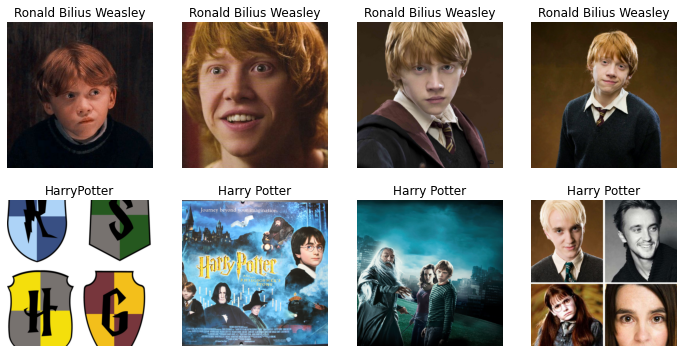

In [ ]:
dls.show_batch()

In [ ]:
lrnr = vision_learner(dls,resnet34,metrics=accuracy) 

In [ ]:
lrnr.fine_tune(1)

epoch,train_loss,valid_loss,accuracy,time
0,1.944444,1.663112,0.458763,01:01


epoch,train_loss,valid_loss,accuracy,time
0,1.539615,1.090526,0.567010,01:03


In [ ]:
net1= lrnr.model[0]
net2= lrnr.model[1]

In [ ]:
_X, _y = dls.one_batch() 

In [ ]:
net1.to("cpu")
net2.to("cpu") 
_X = _X.to("cpu")

In [ ]:
net2= torch.nn.Sequential(
    torch.nn.AdaptiveAvgPool2d(output_size=1), 
    torch.nn.Flatten(), 
    torch.nn.Linear(512,2,bias=False) 
)

In [ ]:
net = torch.nn.Sequential(
    net1,
    net2
)

In [ ]:
lrnr2= Learner(dls,net,metrics=accuracy)

In [ ]:
lrnr2.fine_tune(5) 

epoch,train_loss,valid_loss,accuracy,time


RuntimeError: ignored

In [ ]:
dls.vocab
# net(x)에서 뒤쪽의 값이 클수록 "yunakim" 을 의미한다.

['yeonkyungkim', 'yunakim']

In [ ]:
ximg = PILImage.create('/content/images/test/yeonkyungkim/5f00874f-87e0-47ea-b299-411238c078f3.jpg')
x = first(dls.test_dl([ximg]))[0]

In [ ]:
why = torch.einsum('cb,abij->acij',net2[2].weight,net1(x))

In [ ]:
net2[0](why)

TensorImage([[[[0.2771]],

              [[0.0351]]]], device='cuda:0', grad_fn=<AliasBackward0>)

In [ ]:
net(x)

TensorImage([[0.2771, 0.0351]], device='cuda:0', grad_fn=<AliasBackward0>)

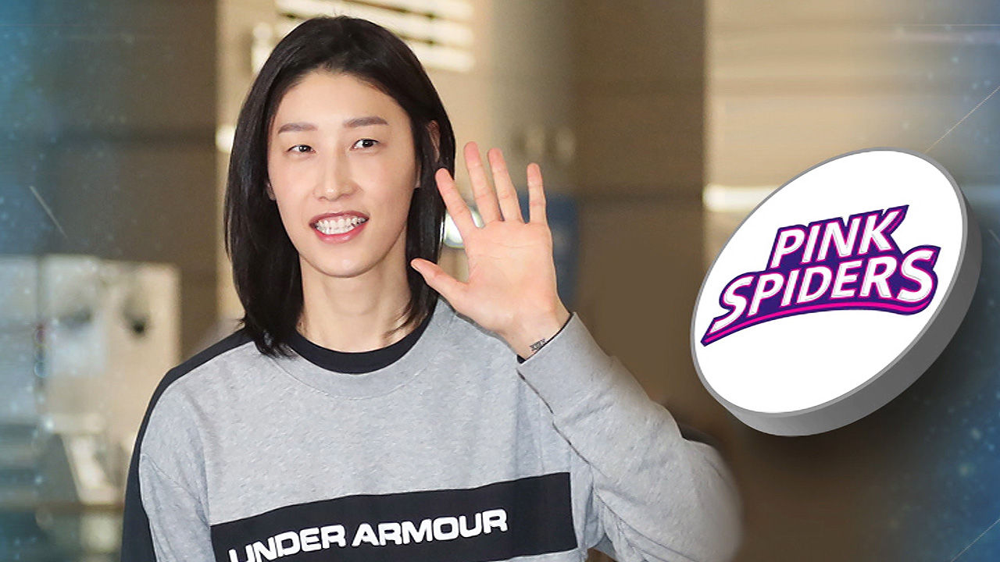

In [ ]:
ximg

In [ ]:
net2(net1(x))

TensorImage([[0.2771, 0.0351]], device='cuda:0', grad_fn=<AliasBackward0>)

- 0.2771>0.0421 이므로 ximg는 yenkyungkim일 확률이 더 높다.

In [ ]:
(why[0,0,:,:]).mean(), (why[0,1,:,:]).mean()

(TensorImage(0.2771, device='cuda:0', grad_fn=<AliasBackward0>),
 TensorImage(0.0351, device='cuda:0', grad_fn=<AliasBackward0>))

In [ ]:
(why[0,0,:,:]).to(torch.int64)

TensorImage([[ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
             [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  1,  0,  0],
             [ 0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  1,  1,  1,  1,  0,  0],
             [ 0,  0, -2, -3, -2, -1,  0,  0,  0,  0,  1,  1,  1,  1,  0,  0],
             [ 0, -1, -3, -3, -1,  0,  0,  0,  0,  0,  1,  1,  1,  1,  0,  0],
             [ 0, -3, -3, -2,  0,  1,  0,  0,  0,  0,  1,  1,  1,  1,  0,  0],
             [-1, -4, -3,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  0,  0],
             [-2, -3, -1,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  0,  1],
             [-1, -2, -1,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  1,  3],
             [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  2,  2],
             [ 0,  0,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0],
             [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
             [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0

In [ ]:
why_yeonkyungkim = why[0,0,:,:]
why_yunakim = why[0,1,:,:]

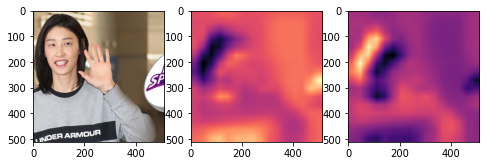

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_yeonkyungkim.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear')
ax[2].imshow(why_yunakim.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear')

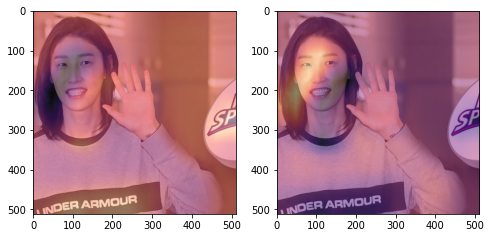

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[0].imshow(why_yeonkyungkim.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)
ax[1].imshow(torch.einsum('ocij -> ijc',dls.decode((x,))[0]).to("cpu"))
ax[1].imshow(why_yunakim.to("cpu").detach(),cmap='magma',extent=(0,511,511,0),interpolation='bilinear',alpha=0.5)

In [ ]:
sftmax = torch.nn.Softmax(dim=1)

In [ ]:
path = './images'

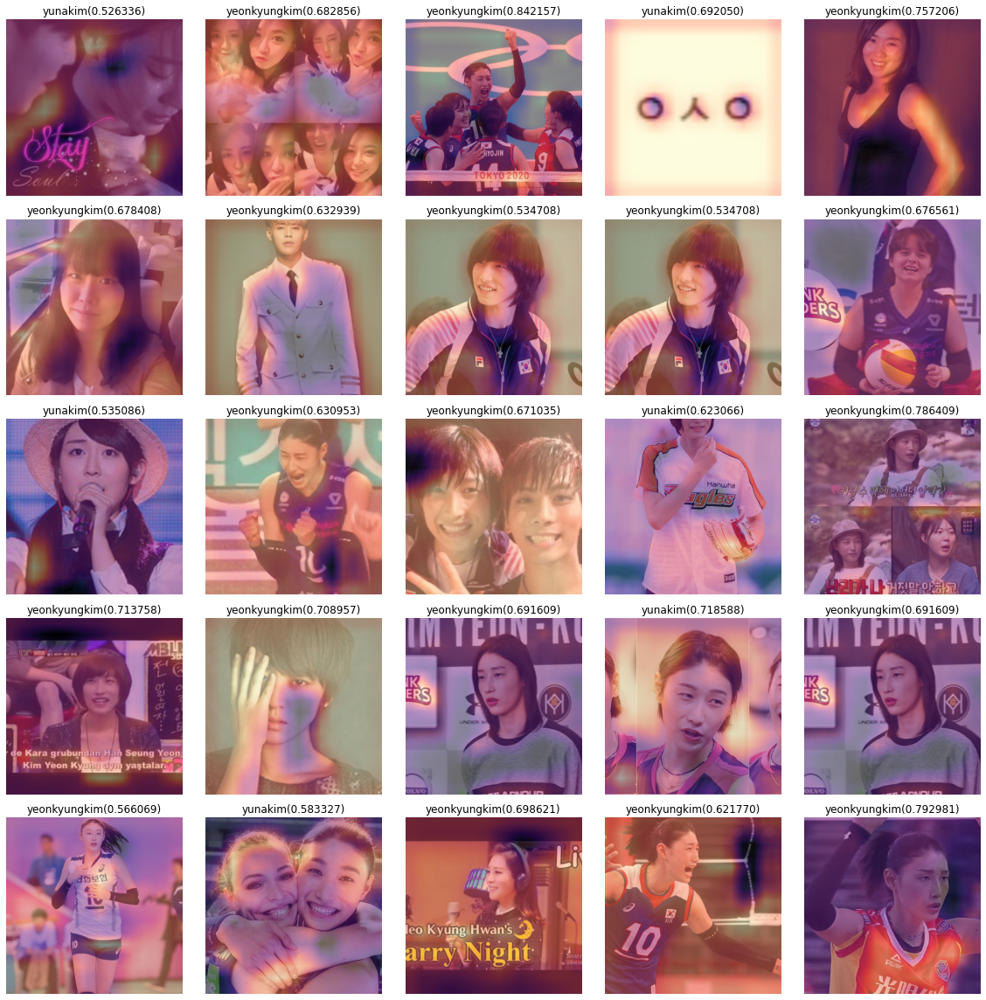

In [ ]:
fig, ax = plt.subplots(5,5) 
k=0 
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_yeonkyungkim = why[0,0,:,:] 
        why_yunakim = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_yeonkyungkim.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("yeonkyungkim(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_yunakim.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("yunakim(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

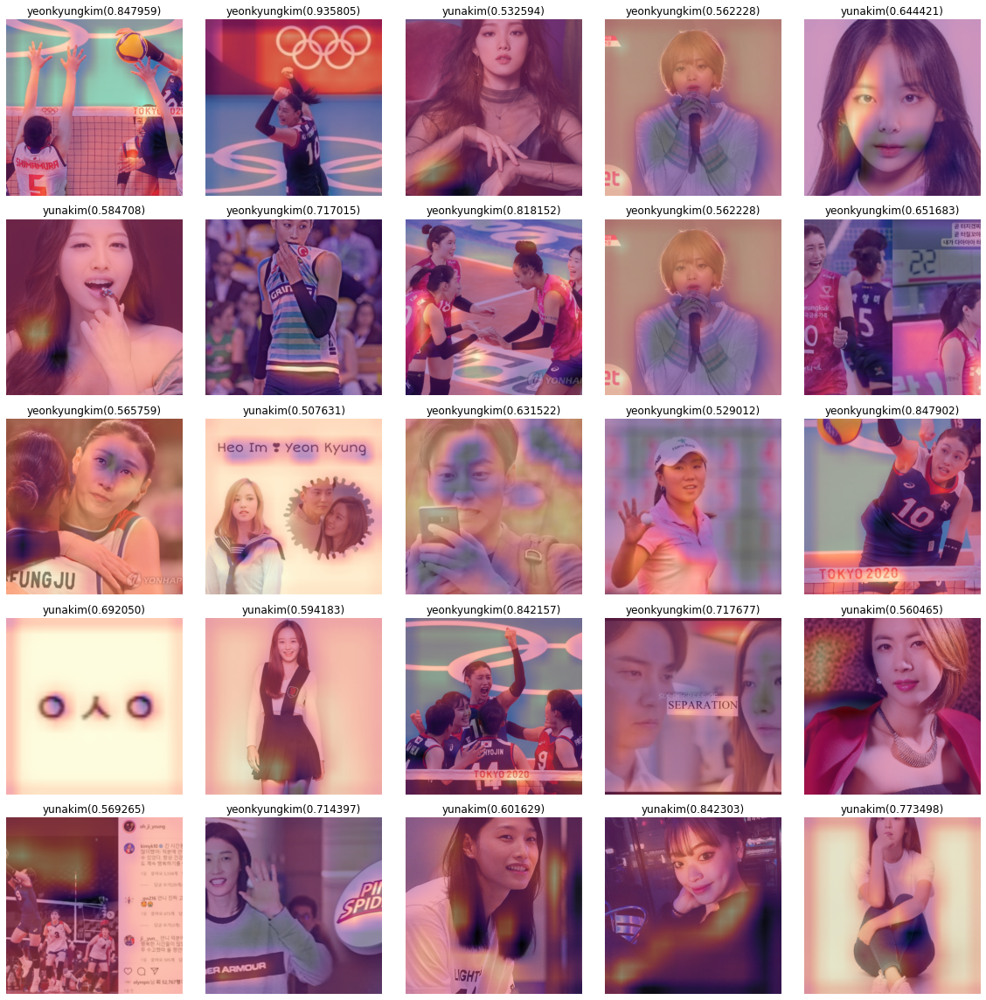

In [ ]:
fig, ax = plt.subplots(5,5) 
k=25
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_yeonkyungkim = why[0,0,:,:] 
        why_yunakim = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_yeonkyungkim.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("yeonkyungkim(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_yunakim.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("yunakim(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

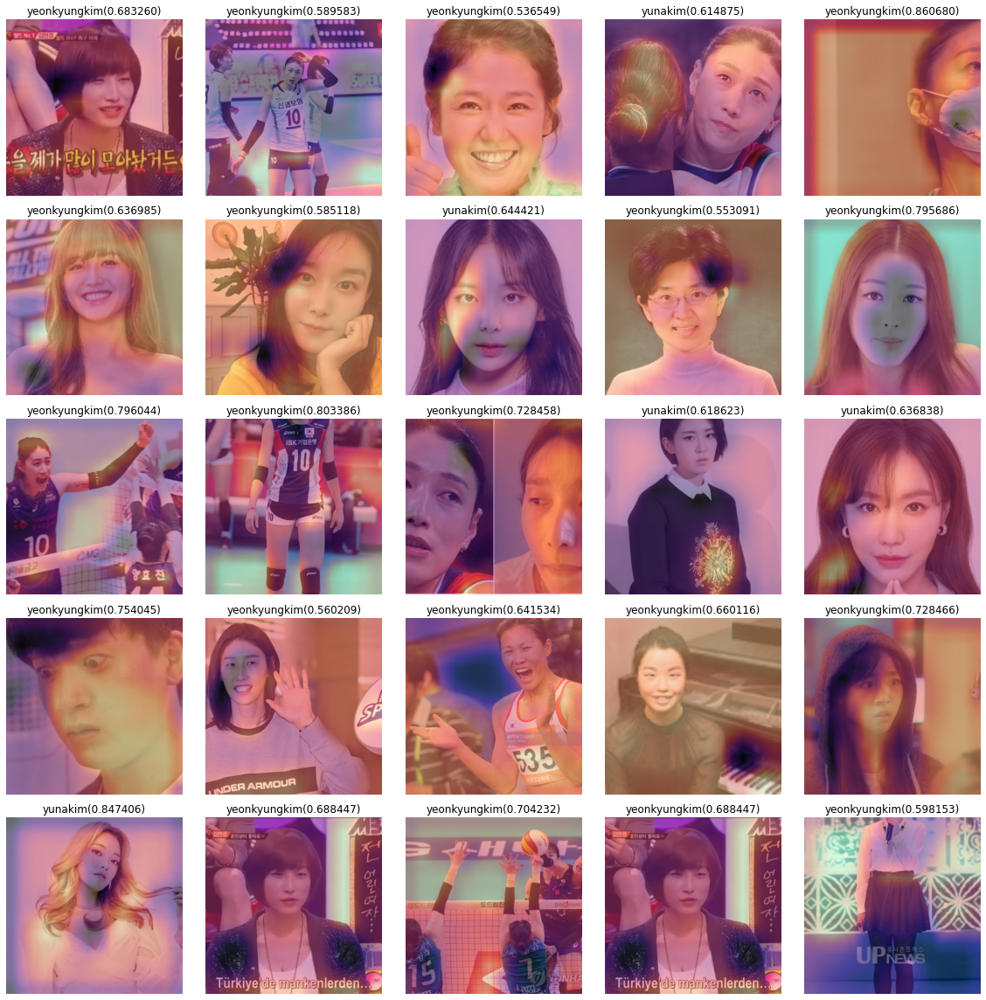

In [ ]:
fig, ax = plt.subplots(5,5) 
k=50
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_yeonkyungkim = why[0,0,:,:] 
        why_yunakim = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_yeonkyungkim.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("yeonkyungkim(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_yunakim.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("yunakim(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

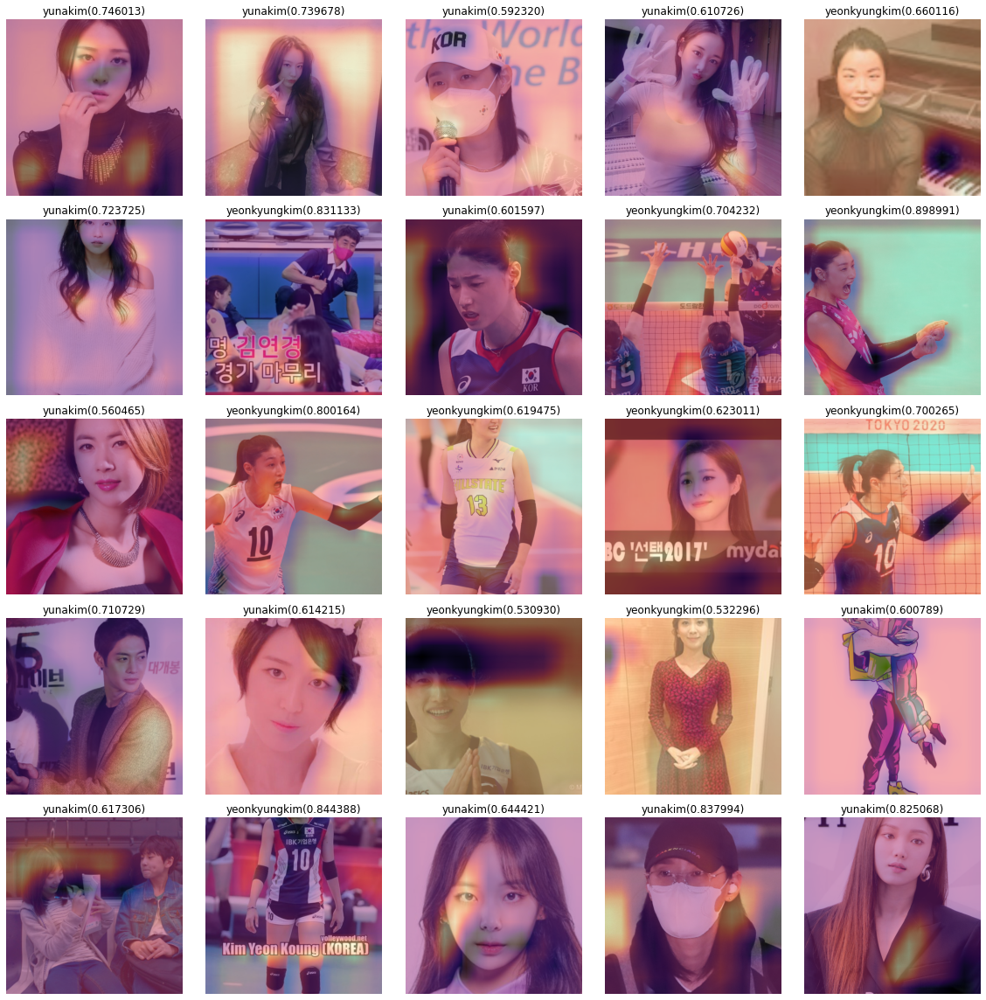

In [ ]:
fig, ax = plt.subplots(5,5) 
k=100
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path)[k])]))
        why = torch.einsum('cb,abij -> acij', net2[2].weight, net1(x))
        why_yeonkyungkim = why[0,0,:,:] 
        why_yunakim = why[0,1,:,:] 
        catprob, dogprob = sftmax(net(x))[0][0].item(), sftmax(net(x))[0][1].item()
        if catprob>dogprob: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_yeonkyungkim.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("yeonkyungkim(%2f)" % catprob)
        else: 
            dls.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(why_yunakim.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='magma')
            ax[i][j].set_title("yunakim(%2f)" % dogprob)
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

# 2. Overparameterized Model

In [ ]:
x = torch.rand([1000,1])*2-1
y = 3.14 + 6.28*x + torch.randn([1000,1]) 

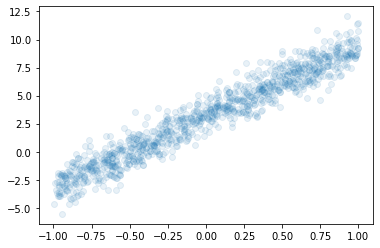

In [ ]:
plt.plot(x,y,'o',alpha=0.1)

In [ ]:
x[:5]

tensor([[ 0.5621],
        [-0.7204],
        [ 0.2043],
        [-0.9416],
        [ 0.7436]])

In [ ]:
# (1) y= beta0 + beta1*x1 + e 
net = torch.nn.Linear(1,1) 
optimizr = torch.optim.SGD(net.parameters(),lr=0.1)

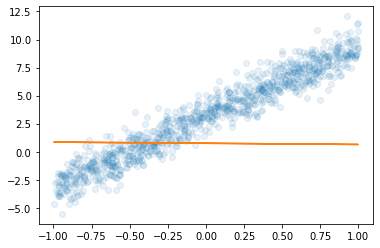

In [ ]:
plt.plot(x,y,'o',alpha=0.1)
plt.plot(x,net(x).data,'-')

In [ ]:
for epoc in range(100):
    ## 1 
    yhat = net(x) 
    ## 2 
    loss = torch.mean((yhat-y)**2)
    ## 3 
    loss.backward()
    ## 4 
    optimizr.step()
    optimizr.zero_grad()

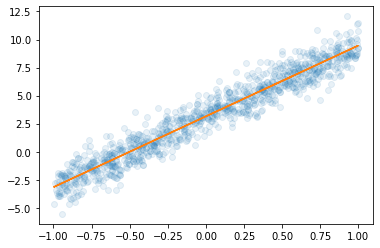

In [ ]:
plt.plot(x,y,'o',alpha=0.1)
plt.plot(x,net(x).data,'-')

In [ ]:
net.weight.data, net.bias.data

(tensor([[6.3128]]), tensor([3.1519]))

beta0 = 3.1519, beta1=6.3128

In [ ]:
# (2) y= beta0 + e
w0hat = torch.tensor([0.00],requires_grad=True) 

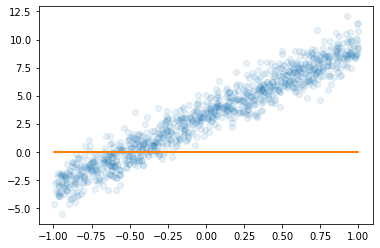

In [ ]:
# 학습전
plt.plot(x,y,'o',alpha=0.1)
plt.plot(x,(x*0+w0hat).data,'-')

In [ ]:
for epoc in range(100):
    ## 1 
    yhat = x*0 + w0hat 
    ## 2 
    loss = torch.mean((yhat-y)**2)
    ## 3 
    loss.backward()
    ## 4 
    w0hat.data = w0hat.data - 0.1 * w0hat.grad
    w0hat.grad = None

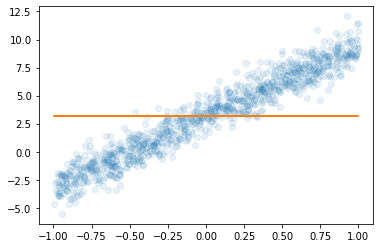

In [ ]:
# 학습 후
plt.plot(x,y,'o',alpha=0.1)
plt.plot(x,(x*0+w0hat).data,'-')

In [ ]:
w0hat

tensor([3.1982], requires_grad=True)

- beta0 = 3.1982

In [ ]:
# (3) y=beta1*x + e 

In [ ]:
net = torch.nn.Linear(in_features=1,out_features=1,bias=False) 
optimizr = torch.optim.SGD(net.parameters(),lr=0.1) 

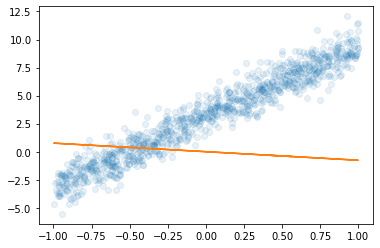

In [ ]:
# 학습전
plt.plot(x,y,'o',alpha=0.1)
plt.plot(x,net(x).data,'-')

In [ ]:
for epoc in range(100):
    ## 1 
    yhat = net(x) 
    ## 2 
    loss = torch.mean((y-yhat)**2)
    ## 3 
    loss.backward() 
    ## 4
    optimizr.step()
    optimizr.zero_grad() 

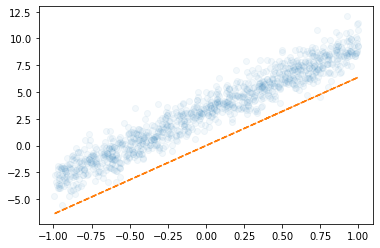

In [ ]:
# 학습후
plt.plot(x,y,'o',alpha=0.05)
plt.plot(x,net(x).data,'--')

In [ ]:
net.weight

Parameter containing:
tensor([[6.3822]], requires_grad=True)

- beta1 = 6.3822

In [ ]:
# (4) y= alpha0 + beta0 + beta1*x + e
_1 = torch.ones([1000,1])
X = torch.concat([_1,x],axis=1)

In [ ]:
net = torch.nn.Linear(in_features=2,out_features=1) 
optimizr = torch.optim.SGD(net.parameters(),lr=0.1) 

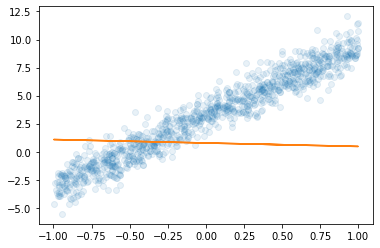

In [ ]:
# 학습전
plt.plot(x,y,'o',alpha=0.1)
plt.plot(x,net(X).data,'-')

In [ ]:
for epoc in range(100):
    ## 1 
    yhat = net(X) 
    ## 2 
    loss = torch.mean((y-yhat)**2)
    ## 3 
    loss.backward() 
    ## 4
    optimizr.step()
    optimizr.zero_grad() 

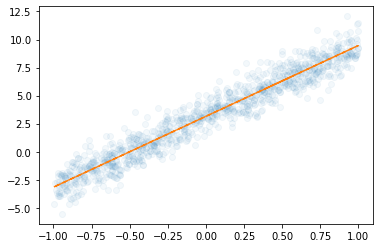

In [ ]:
# 학습후
plt.plot(x,y,'o',alpha=0.05)
plt.plot(x,net(X).data,'--')

In [ ]:
net.bias,net.weight

(Parameter containing:
 tensor([1.3951], requires_grad=True), Parameter containing:
 tensor([[1.7568, 6.3125]], requires_grad=True))

In [ ]:
# alpha0 + beta0
1.3951+1.7568

3.1519

- alpha0 + beat0 = 3.1519 이며 (1)에서 구한 beta0 값인 3.1519와 동일하다.

In [ ]:
# (5) y=alpha0 + beta0 + beta1*x + alpha1*x + e
X = torch.concat([_1,_1,x,x],axis=1) 
X

tensor([[ 1.0000,  1.0000,  0.5621,  0.5621],
        [ 1.0000,  1.0000, -0.7204, -0.7204],
        [ 1.0000,  1.0000,  0.2043,  0.2043],
        ...,
        [ 1.0000,  1.0000, -0.6327, -0.6327],
        [ 1.0000,  1.0000,  0.8546,  0.8546],
        [ 1.0000,  1.0000,  0.3835,  0.3835]])

In [ ]:
net = torch.nn.Linear(in_features=4,out_features=1,bias=False) 
optimizr = torch.optim.SGD(net.parameters(),lr=0.1) 

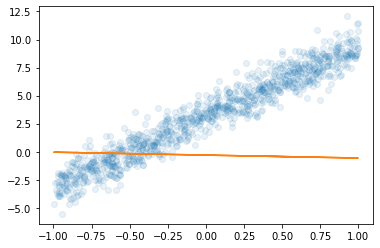

In [ ]:
# 학습전
plt.plot(x,y,'o',alpha=0.1)
plt.plot(x,net(X).data,'-')

In [ ]:
for epoc in range(100):
    ## 1 
    yhat = net(X) 
    ## 2 
    loss = torch.mean((y-yhat)**2)
    ## 3 
    loss.backward() 
    ## 4
    optimizr.step()
    optimizr.zero_grad() 

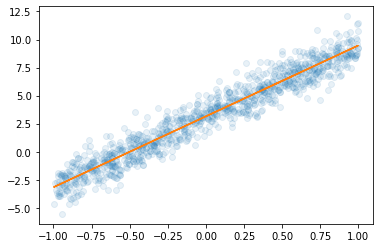

In [ ]:
# 학습후
plt.plot(x,y,'o',alpha=0.1)
plt.plot(x,net(X).data,'-')

In [ ]:
net.weight, net.bias

(Parameter containing:
 tensor([[1.7991, 1.3527, 3.3789, 2.9408]], requires_grad=True), None)

In [ ]:
# alpha0 + beta0
1.7991+1.3527

3.1517999999999997

In [ ]:
# alpha1 + beta1
3.3789+2.9408

6.319699999999999

- alpha0+beta0 = 3.1518, alpha1+beta1 = 6.3197로 (1)에서 구한 값과 비슷하다.

(6) 민정, 슬기, 성재, 세민, 구환 모두 옳은 설명

# 3. 차원축소기법과 표현학습

In [ ]:
df = pd.read_csv("https://raw.githubusercontent.com/guebin/STML2022/master/posts/iris.csv")
df

,Sepal Length,Sepal Width,Petal Length,Petal Width,Species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


In [ ]:
X = torch.tensor(df.drop(columns=['Species']).to_numpy(), dtype=torch.float32)

In [ ]:
X.shape

torch.Size([150, 4])

In [ ]:
l1 = torch.nn.Linear(in_features=4, out_features=2, bias=False)
print(l1(X).shape)

torch.Size([150, 2])


In [ ]:
# k=3이상인 경우 softmax와 crossentropyloss사용

a1=torch.nn.Softmax(dim=1)
Z=a1(l1(X))

In [ ]:
l2 = torch.nn.Linear(in_features=2, out_features=4, bias=False)

In [ ]:
Xhat = l2(l1(X))

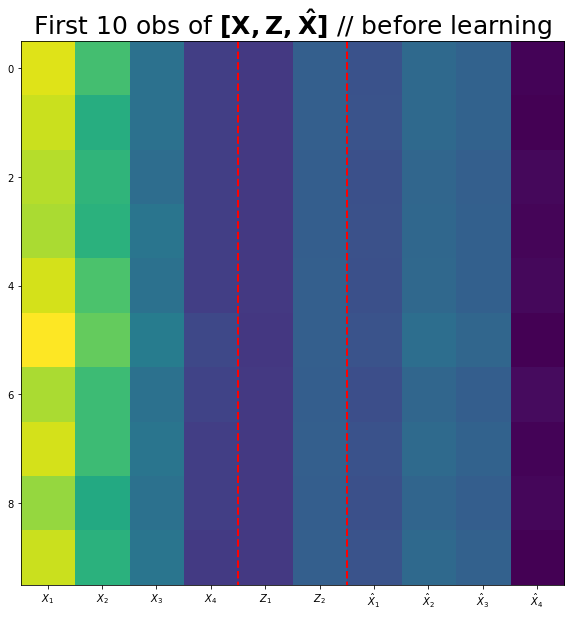

In [ ]:
fig,ax = plt.subplots(figsize=(10,10)) 
ax.imshow(torch.concat([X,Z.data,Xhat.data],axis=1)[:10])
ax.set_xticks(np.arange(0,10)) 
ax.set_xticklabels([r'$X_1$',r'$X_2$',r'$X_3$',r'$X_4$',r'$Z_1$',r'$Z_2$',r'$\hat{X}_1$',r'$\hat{X}_2$',r'$\hat{X}_3$',r'$\hat{X}_4$'])
ax.vlines([3.5,5.5],ymin=-0.5,ymax=9.5,lw=2,color='red',linestyle='dashed')
ax.set_title(r'First 10 obs of $\bf [X, Z, \hat{X}]$ // before learning',size=25);

In [ ]:
net = torch.nn.Sequential(
    l1,   # 선형변환 
    l2,
)

loss_fn= torch.nn.MSELoss()
optimizr= torch.optim.Adam(net.parameters())

In [ ]:
for epoc in range(1000): 
    ## 1 
    Z = net[0](X)
    Xhat = net[1](Z) 
    ## 2 
    loss=loss_fn(Xhat,X) 
    ## 3 
    loss.backward()
    ## 4 
    optimizr.step()
    optimizr.zero_grad() 

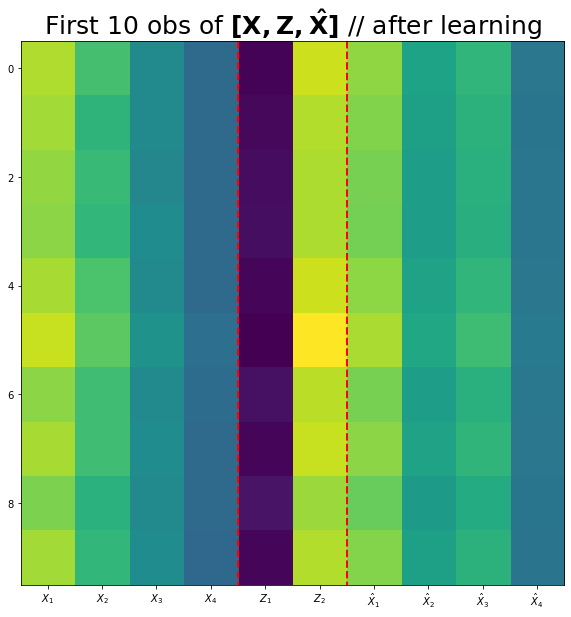

In [ ]:
fig,ax = plt.subplots(figsize=(10,10)) 
ax.imshow(torch.concat([X,Z.data,Xhat.data],axis=1)[:10])
ax.set_xticks(np.arange(0,10)) 
ax.set_xticklabels([r'$X_1$',r'$X_2$',r'$X_3$',r'$X_4$',r'$Z_1$',r'$Z_2$',r'$\hat{X}_1$',r'$\hat{X}_2$',r'$\hat{X}_3$',r'$\hat{X}_4$'])
ax.vlines([3.5,5.5],ymin=-0.5,ymax=9.5,lw=2,color='red',linestyle='dashed')
ax.set_title(r'First 10 obs of $\bf [X, Z, \hat{X}]$ // after learning',size=25);

In [ ]:
# (4) Z -> y 로 가는 네트워크 설계

net=torch.nn.Linear(2,4)

In [ ]:
net(Z)[:5]

tensor([[ 1.9397, -2.4390,  4.0082, -4.5496],
        [ 1.8009, -2.3025,  3.7815, -4.3085],
        [ 1.8454, -2.2254,  3.7054, -4.1847],
        [ 1.8578, -2.2069,  3.6879, -4.1551],
        [ 1.9715, -2.4088,  3.9845, -4.5026]], grad_fn=<SliceBackward0>)

In [ ]:
loss_fn= torch.nn.BCEWithLogitsLoss()
optimizr= torch.optim.Adam(net.parameters())

In [ ]:
for epoc in range(1000): 
    ## 1 
    Xhat = net(Z)
    ## 2 
    loss=loss_fn(Xhat,X) 
    ## 3 
    loss.backward()
    ## 4 
    optimizr.step()
    optimizr.zero_grad() 

    # 오류가 나는데 밑에 글을 봐도 잘 모르겠어용.. ㅠㅠ 

RuntimeError: ignored

(5) 규빈, 민정, 성재, 슬기 모두 옳은 설명이다.